# 화음에 대하여..

우리가 듣는 음정은 1 옥타브 올라갈 때마다 주파수가 2배 증가하며, 인접한 계이름 사이마다 주파수가 $2^{1/12}$ 배 증가한다고  알려져있다.

인간은 음높이가 증가한다는 것을 linear하게 인식하지만, 주파수는 logarithmic하게 증가한다.

그러나, 내가 한가지 간과한 것이 있었다면, "도-레-미-파-솔-라-시-도"의 음높이 증가가 logarithmic한 증가가 아니었고,

"도-도#-레-레#-미-파-파#-솔-솔#-라-라#-시-도"의 음높이 증가가 logarithmic하다는 것이었다.

----------------------------------------------------------------------------

그렇다면, 내가 아름답다고 느낄 수 있는 화음들이 수학적으로는 아름답지 않았다는 사실이 보인다.

위에서 "도-도#-레-레#-미-파-파#-솔-솔#-라-라#-시"에 1부터 12까지의 숫자를 붙이게 된다면, 흔하게 쓰이는 화음은 다음의 숫자로 표현이 가능하다

    으뜸화음 (도-미-솔) = (1-5-8) -> 등차를 이루지 않음

    버금딸림화음 (파-라-도) = (6-10-13) -> 등차를 이루지 않음

    딸림화음 (솔-시-레) = (8-12-15) -> 등차를 이루지 않음



실제로 등차를 이루는 화음 (1-5-9), (6-10-14), (8-12-16)의 화음은 Augemnted Triad (증5화음) 이라고 불리며, "긴장감"을 준다.

어째서, 수학적으로 아름다운 화음은 심리적으로 긴장감을 줄까?

------------------------------------------------------------------------

솔의 주파수는 도의 주파수와 비교했을 때, $2^{7/12}$ 배이고, 높은음의 솔의 소리는 $2^{19/12}$ 배의 주파수를 가진다.

이는 거의 3의 숫자를 가진다. (2.997배)


마찬가지로 미의 주파수는 $2^{5/12}$ 배인데, 두 옥타브 높은 미의 주파수는 대략적으로 5배의 주파수를 가진다. (5.339배)

그래서 도-미-솔은 4-5-6 배의 주파수를 가지는데, 이것이 귀에 조화롭게 들려서 안정감을 준다고 한다.

이 접근법을 사용한다면 "도-미-솔", "파-라-도", "솔-시-레"의 주파수는 모두 4-5-6 배의 비율을 가진다고 볼 수 있다.

------------------------------------------------------------------------

여기에서 한가지 더 궁금증이 생겼다.

위의 주파수 비율은 완벽하게 4:5:6이 아닌데도 아름답게 들린다.

그렇다면, 정말 완벽한 4:5:6의 주파수 소리는 우리가 알고 있는 화음보다 더 아름답게 들릴 것인가?

이에 대해 아래의 간단한 python code로 확인해보는 작업을 해봤다.

이 code의 내용은 https://colab.research.google.com/drive/1Bvznex50Dfnga6YsOcgp2wqpyVBRn5N0?usp=sharing 에서 직접 실행해볼 수 있다.

In [ ]:
import numpy as np
import IPython.display as ipd
import scipy.io.wavfile as wav
import matplotlib.pyplot as plt
from IPython.display import display

# Google Colab에서 그래프 자동 출력 설정
%matplotlib inline

def freq_ratio(n):
  return 2**(n/12)

def 주파수(계이름, C4_freq=261.63):
    """
    C4_freq를 기준으로 note에 해당하는 주파수를 계산합니다.

    :param note: 음계 이름 (예: 'C', 'D#', 'G')
    :param C4_freq: 기준 C4의 주파수 (Hz)
    :return: 계산된 주파수 (Hz)
    """
    note_map = {
        '도': 0, '도#': 1, '레b': 1, '레': 2, '레#': 3, '미b': 3,
        '미': 4, '파': 5, '파#': 6, '솔b': 6, '솔': 7, '솔#': 8, '라b': 8,
        '라': 9, '라#': 10, '시b': 10, '시': 11
    }
    if 계이름 not in note_map:
        raise ValueError("Invalid note name")

    return C4_freq * freq_ratio(note_map[계이름])

def generate_tone(frequencies=[440], duration=1.0, sample_rate=44100, plot_waveform=True):
    """
    여러 주파수(frequencies)의 사인파 소리를 생성하고 Colab에서 재생합니다.

    :param frequencies: 소리의 주파수 리스트 (Hz)
    :param duration: 소리의 지속 시간 (초)
    :param sample_rate: 샘플링 레이트 (Hz)
    :param plot_waveform: 생성된 파형을 시각적으로 출력할지 여부
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    wave = np.zeros_like(t)

    for frequency in frequencies:
        wave += 0.5 * np.sin(2 * np.pi * frequency * t)  # 각 주파수의 사인파를 합산

    wave /= len(frequencies)  # 볼륨을 조절하여 클리핑 방지
    wave_int16 = (wave * 32767).astype(np.int16)  # 16-bit PCM 변환

    if plot_waveform:
        plt.figure(figsize=(20, 4))
        plt.plot(t[:2000], wave[:2000])  # 처음 1000 샘플만 표시하여 가시성 향상
        plt.title("Generated Waveform")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Amplitude")
        plt.grid()
        # display(plt.gcf())  # Colab에서 명확한 출력 보장
        # plt.show()

    wav.write("output.wav", sample_rate, wave_int16)
    return ipd.Audio("output.wav")

def wave_data(frequencies=[440], duration=1.0, sample_rate=44100, plot_waveform=True):
    """
    여러 주파수(frequencies)의 사인파 소리에 대한 wave를 생성.

    :param frequencies: 소리의 주파수 리스트 (Hz)
    :param duration: 소리의 지속 시간 (초)
    :param sample_rate: 샘플링 레이트 (Hz)
    :param plot_waveform: 생성된 파형을 시각적으로 출력할지 여부
    """
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    wave = np.zeros_like(t)

    for frequency in frequencies:
        wave += 0.5 * np.sin(2 * np.pi * frequency * t)  # 각 주파수의 사인파를 합산

    wave /= len(frequencies)  # 볼륨을 조절하여 클리핑 방지
    wave_int16 = (wave * 32767).astype(np.int16)  # 16-bit PCM 변환


    return t, wave

In [ ]:
C4_freq = 261.63 #[Hz] 중앙 도의 소리

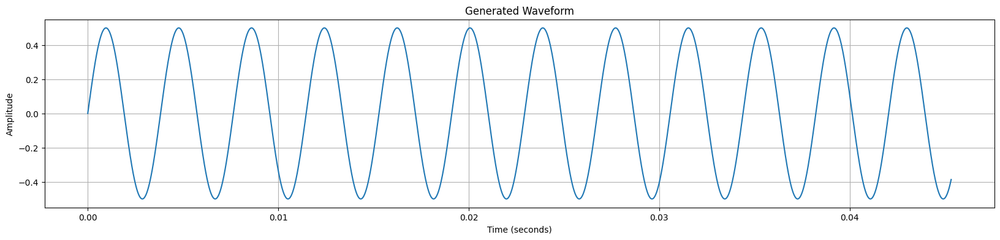

In [ ]:
generate_tone([C4_freq], 5, plot_waveform=True)

In [ ]:
print(f"도와 미의 주파수는  4:{4*freq_ratio(4)}의 ratio를 가졌다. 이는 대략 4:5이다.")
print(f"도와 솔의 주파수는  4:{4*freq_ratio(7)}의 ratio를 가졌다. 이는 대략 4:6이다.")

print("도-미-솔의 화음은 대략 4:5:6 의 ratio를 가졌다. 그렇기에 아름답게 들린다고 한다.")
print("그렇다면 정말 완벽하게 4:5:6 의 ratio를 가진 음을 들으면 더 아름답다고 느낄 것인가?")
print("아래는 이를 확인할 수 있는 결과다.")

도와 미의 주파수는  4:5.039684199579493의 ratio를 가졌다. 이는 대략 4:5이다.
도와 솔의 주파수는  4:5.993228307506726의 ratio를 가졌다. 이는 대략 4:6이다.
도-미-솔의 화음은 대략 4:5:6 의 ratio를 가졌다. 그렇기에 아름답게 들린다고 한다.
그렇다면 정말 완벽하게 4:5:6 의 ratio를 가진 음을 들으면 더 아름답다고 느낄 것인가?
아래는 이를 확인할 수 있는 결과다.


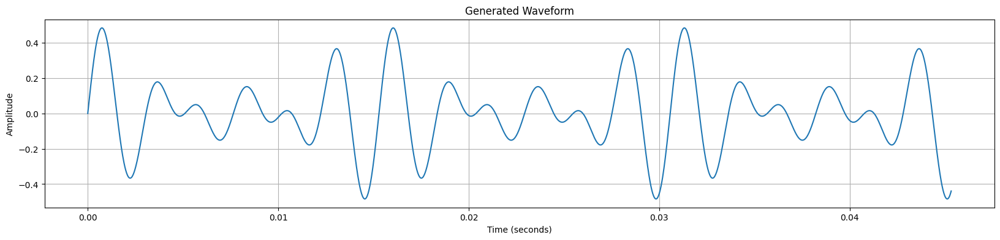

In [ ]:
# 정확하게 4:5:6의 주파수를 가진 음들의 화음
generate_tone([주파수('도'), 주파수('도') * 5/4, 주파수('도') * 6/4], 10)

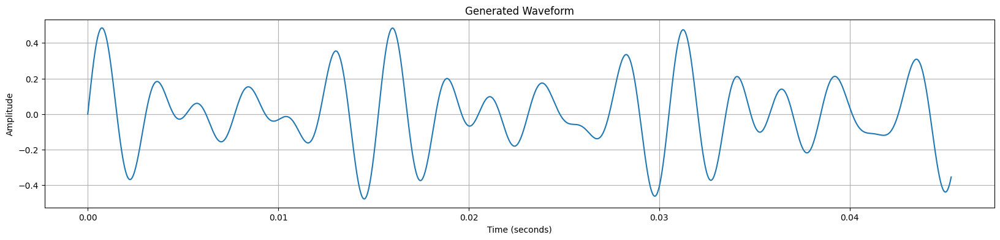

In [ ]:
# 도-미-솔의 화음
generate_tone([주파수('도'), 주파수('미'), 주파수('솔')], 10)

In [ ]:
print(f"주파수('도') = {주파수('도')}")
print(f"주파수('미') = {주파수('미')}")
print(f"주파수('솔') = {주파수('솔')}")
print('\n')
print(f"주파수('도') = {주파수('도')}")
print(f"주파수('도') * 5/4 = {주파수('도') * 5/4}")
print(f"주파수('도') * 6/4 = {주파수('도') * 6/4}")



주파수('도') = 261.63
주파수('미') = 329.63314428399565
주파수('솔') = 392.0020805232462


주파수('도') = 261.63
주파수('도') * 5/4 = 327.0375
주파수('도') * 6/4 = 392.445


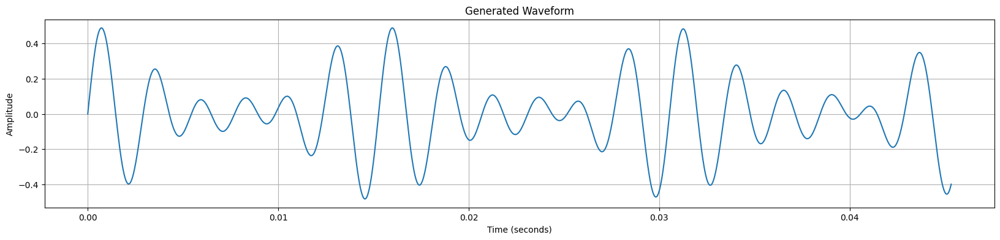

In [ ]:
# 도-미-솔의 화음과, 정확하게 4:5:6의 주파수를 가진 음들의 화음을 동시에 틀었을 때.
generate_tone([주파수('도'), 주파수('도') * 5/4, 주파수('도') * 6/4, 주파수('미'), 주파수('솔')], 5)

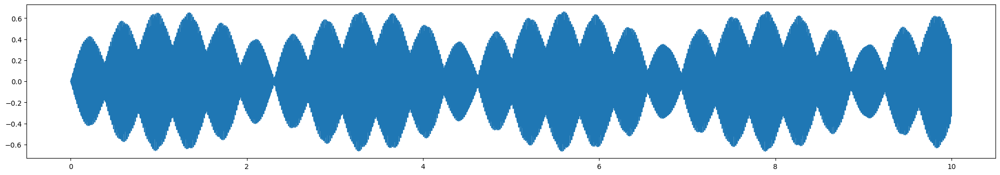

In [ ]:
t1, result1 = wave_data([주파수('도'), 주파수('미'), 주파수('솔')], 10)
t2, result2 = wave_data([주파수('도'), 주파수('도') * 5/4, 주파수('도') * 6/4], 10)
plt.figure(figsize=(25, 4))
plt.plot(t1, result2 - result1)

어떤 음이 더 아름답게 들렸는지 모르겠으나,

나는 4:5:6의 화음과 도-미-솔의 화음이 거의 비슷하게 들렸다.

그렇기에, 4:5:6의 화음이 가장 아름답게 들린다는것이 맞을 수도 있을 것 같다는 결론을 얻었다.

아래는 '파' 음과 '솔' 음에서 시작하는 4:5:6 주파수 화음을 구해본 결과들이다.

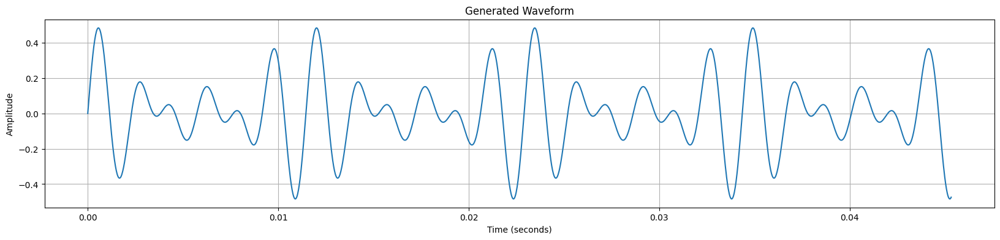

In [93]:
# 정확하게 4:5:6의 주파수를 가진 음들의 화음
generate_tone([주파수('파'), 주파수('파') * 5/4, 주파수('파') * 6/4], 10)

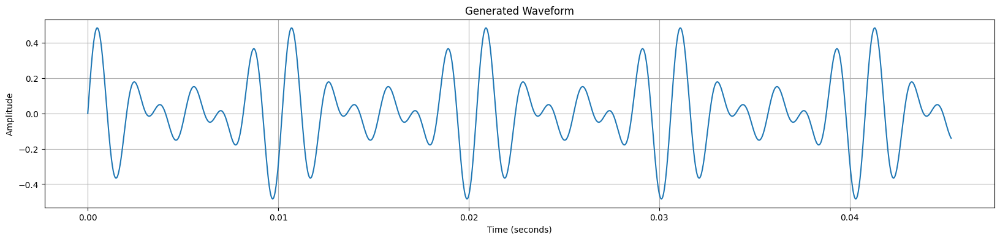

In [94]:
# 정확하게 4:5:6의 주파수를 가진 음들의 화음
generate_tone([주파수('솔'), 주파수('솔') * 5/4, 주파수('솔') * 6/4], 10)

# 화음간 waveform의 형태

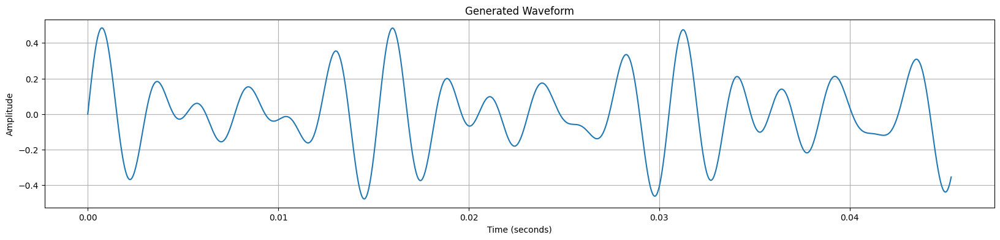

In [ ]:
# 도-미-솔의 화음
generate_tone([주파수('도'), 주파수('미'), 주파수('솔')], 10)

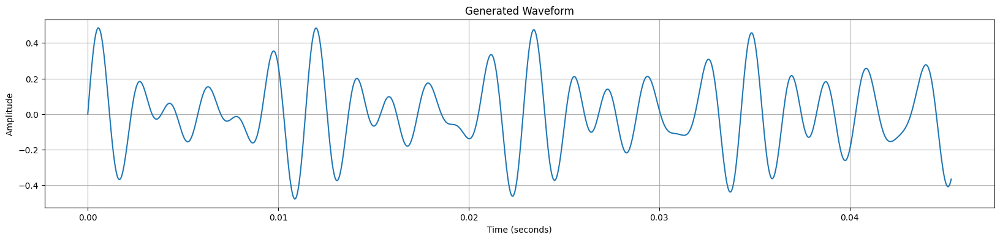

In [ ]:
# 파-라-도의 화음
generate_tone([주파수('파'), 주파수('라'), 주파수('도') * 2], 10)

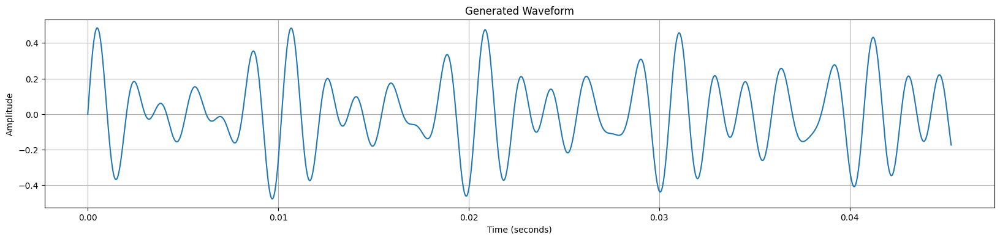

In [ ]:
# 솔-시-레의 화음
generate_tone([주파수('솔'), 주파수('시'), 주파수('레')*2], 10)

위에는 가장 많이 활용되는 화음의 waveform을 그려본 결과들이다.

분명 다른 소리인데, waveform이 비슷하게 보인다는 것을 확인할 수 있었다.

단지, 시간축에서 늘어지는 정도만 달라보였다.

이것이 정말인지, 아래와 같이 검증해봤다.

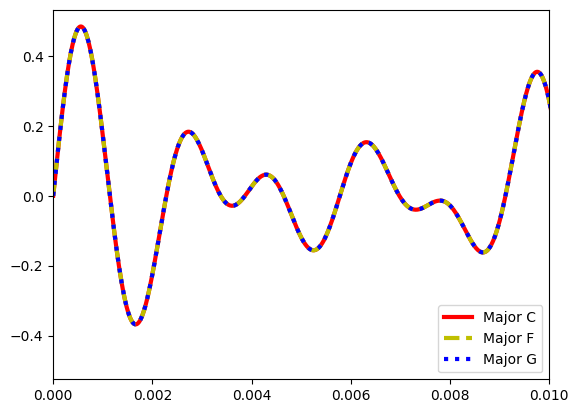

In [92]:
# 아래 결과는 "도-미-솔", "파-라-도", "솔-시-레"의 화음이 가지는 waveform 형태가 시간에 따라 늘어진 정도만 다를 뿐, 형태는 같다는 것을 보여주는 결과이다.

t3, result3 = wave_data([주파수('도'), 주파수('미'), 주파수('솔')], 10)
t4, result4 = wave_data([주파수('파'), 주파수('라'), 주파수('도') * 2], 10)
t5, result5 = wave_data([주파수('솔'), 주파수('시'), 주파수('레')*2], 10)

plt.plot(t3[:1000] * 주파수('도') / 주파수('파'), result3[:1000], 'r', label = 'Major C', linewidth=3)
plt.plot(t4[:1000], result4[:1000], 'y--', label = 'Major F', linewidth=3)
plt.plot(t5[:1000] *주파수('솔') / 주파수('파'), result5[:1000], 'b:', label = 'Major G', linewidth=3)
plt.xlim(0,0.01)
plt.legend()

잘 겹친다는 것을 확인할 수 있었다.

#Augmented Triad

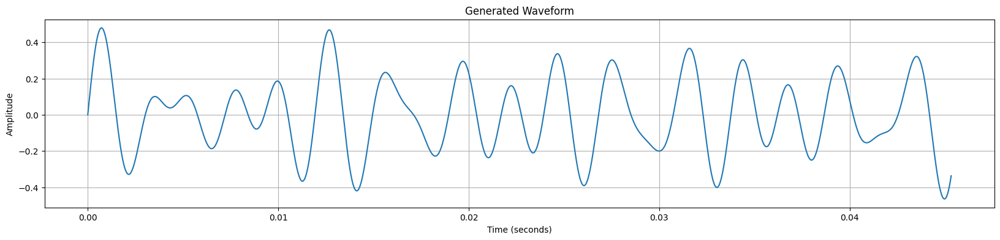

In [95]:
# 도-미-솔#의 화음 -> Augmented Triad
generate_tone([주파수('도'), 주파수('미'), 주파수('솔#')], 10)

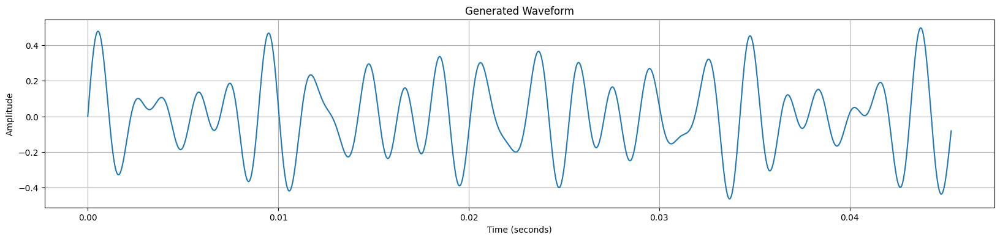

In [96]:
# 파-라-도#의 화음 -> Augmented Triad
generate_tone([주파수('파'), 주파수('라'), 주파수('도#') * 2], 10)

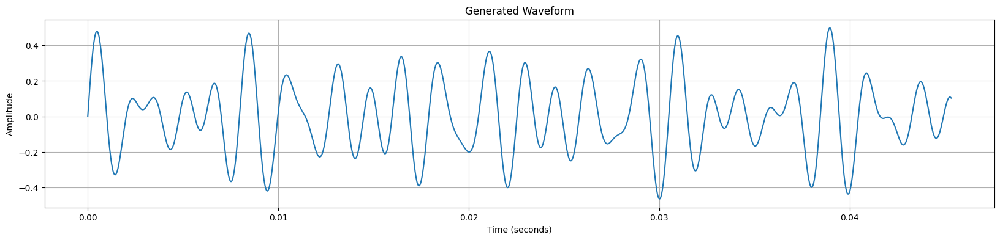

In [97]:
# 솔-시-레#의 화음 -> Augmented Triad
generate_tone([주파수('솔'), 주파수('시'), 주파수('레#') * 2], 10)

약간의(?) 긴장감을 주는 것 같다. 실제 피아노 음으로 위의 음을 들으면 더 긴장감이 느껴진다.

# 화음과 Fourier Transformation

화음에 대한 wave를 얻어봤는데, 이걸 얻다보니, 이 결과에 Fourier transformation을 하고 이를 시각화해보면 조금 더 재미있을 것 같다는 생각이 들었다.

여기에서 Fourier transformation의 정의는 다음과 같다.

$$\tilde{f}(\omega)\equiv \frac{1}{\sqrt{2\pi}} \int_{-\infty}^{\infty} f(t) e^{-i\omega t} dt$$

$$f(t) = \frac{1}{\sqrt{2\pi}} \int_{-\infty}^{\infty} \tilde{f}(\omega) e^{i\omega t} d\omega$$

화음의 wave는 다양한 frequency를 가진 wave의 합으로 나타나는데, Fourier transformation을 하면, 이 frequency가 sharp한 peak (ideally, delta function shape)으로 나타나게 된다.

이 peak 위치를 확인해보고, 원래의 값과 얼마나 잘 맞는지 확인해봤다.

In [ ]:
def plot_frequency_spectrum(wave, freq_max = 1000):
      sample_rate = 44100

      freqs = np.fft.rfftfreq(len(wave), 1/sample_rate)
      fft_spectrum = np.abs(np.fft.rfft(wave))

      plt.figure(figsize=(10, 4))
      plt.plot(freqs, fft_spectrum)
      plt.xlim(0,freq_max)
      plt.title("Frequency Spectrum")
      plt.xlabel("Frequency (Hz)")
      plt.ylabel("Magnitude")
      plt.grid()

      return freqs, fft_spectrum

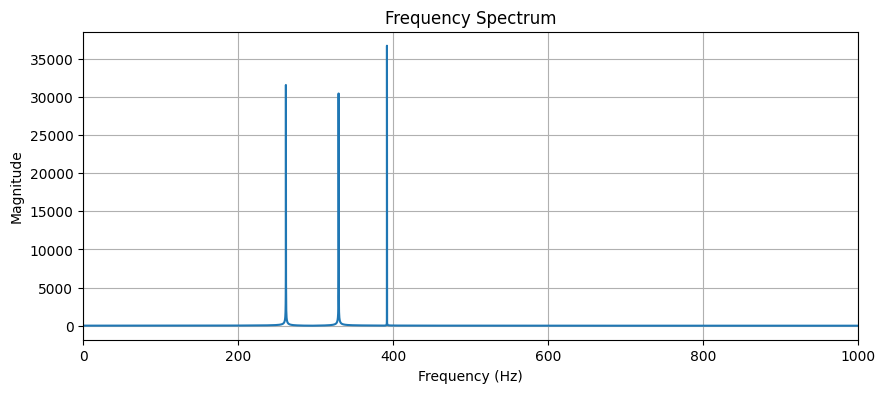

In [ ]:
f6, result6 = plot_frequency_spectrum(result3)

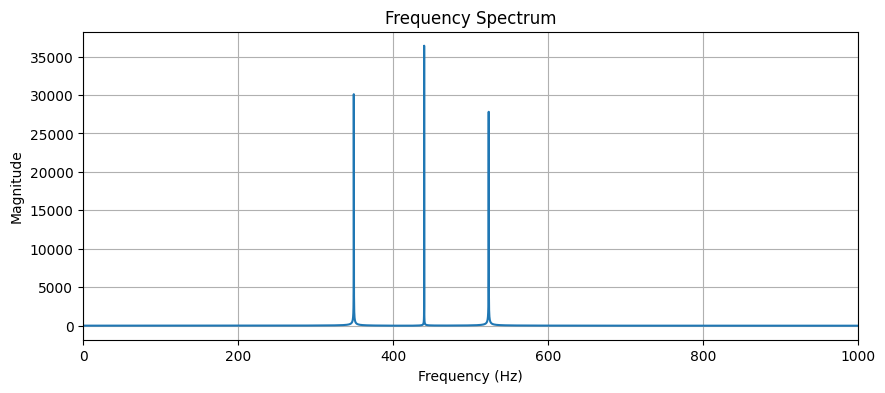

In [ ]:
f7, result7 = plot_frequency_spectrum(result4)

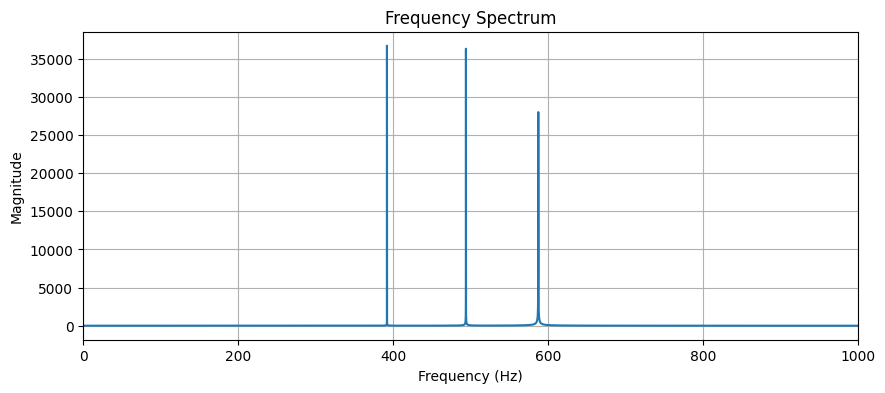

In [ ]:
f8, result8 = plot_frequency_spectrum(result5)

In [ ]:
import numpy as np
from scipy.signal import find_peaks

def find_peaks_in_data(x, y, prominence=1):
    """
    주어진 x, y 데이터에서 피크의 위치를 찾아 반환합니다.

    :param x: x 값들의 배열
    :param y: y 값들의 배열
    :param prominence: 피크의 두드러짐 정도를 결정하는 임계값 (기본값: 1)
    :return: 피크의 x 값들의 배열
    """
    # y 배열에서 피크의 인덱스 찾기
    peak_indices = find_peaks(y, prominence=prominence)[0]
    # 피크에 해당하는 x 값 반환
    peak_x_values = x[peak_indices]
    return peak_x_values


아래는 Fourier Transformation을 통해 얻은 frequency와 실제 input값으로 사용된 frequency를 비교한 결과이다.

In [ ]:
# input 값
# t3, result3 = wave_data([주파수('도'), 주파수('미'), 주파수('솔')], 10)
# t4, result4 = wave_data([주파수('파'), 주파수('라'), 주파수('도') * 2], 10)
# t5, result5 = wave_data([주파수('솔'), 주파수('시'), 주파수('레')*2], 10)

# Fourier transformation 값
# f6, result6 = plot_frequency_spectrum(result3)
# f7, result7 = plot_frequency_spectrum(result4)
# f8, result8 = plot_frequency_spectrum(result5)

In [ ]:
find_peaks_in_data(f6, result6) # 도-미-솔

array([261.6, 329.6, 392. ])

In [ ]:
print(f"{주파수('도')}, {주파수('미')}, {주파수('솔')}")

261.63, 329.63314428399565, 392.0020805232462


In [ ]:
find_peaks_in_data(f7, result7) # 파-라-도

array([349.2, 440. , 523.3])

In [ ]:
print(f"{주파수('파')}, {주파수('라')}, {주파수('도') * 2}")

349.2341510465061, 440.00745824565865, 523.26


In [ ]:
find_peaks_in_data(f8, result8) # 솔-시-레

array([392. , 493.9, 587.3])

In [ ]:
print(f"{주파수('솔')}, {주파수('시')}, {주파수('레') * 2}")

392.0020805232462, 493.8916728538229, 587.3394913983625


위의 결과를 보면 알 수 있듯이, Fourier transformation으로 wave 결과를 transform하게 되면,

어떤 frequency의 음이 활용되었는지 바로 확인할 수 있게 된다.

이른바, 수학을 활용한 절대 음감이라고 할 수 있을 것이다.